In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/burn-data-seg/burn_intensity_data/train_images/quarry_ca3806111999220230909_0224_0000_HLS.tiff
/kaggle/input/burn-data-seg/burn_intensity_data/train_images/mountain_az_0224_0224_HLS.tiff
/kaggle/input/burn-data-seg/burn_intensity_data/train_images/or4265012082720180815_0000_0448_HLS.tiff
/kaggle/input/burn-data-seg/burn_intensity_data/train_images/rabbit_ca3671811888320230930_0000_0000_HLS.tiff
/kaggle/input/burn-data-seg/burn_intensity_data/train_images/dixie_id4558511544420210705_0000_0224_HLS.tiff
/kaggle/input/burn-data-seg/burn_intensity_data/train_images/nm3372410853720180522_0000_0448_HLS.tiff
/kaggle/input/burn-data-seg/burn_intensity_data/train_images/quarry_ca3806111999220230909_0000_0000_HLS.tiff
/kaggle/input/burn-data-seg/burn_intensity_data/train_images/grizzlycreek_0224_0224_HLS.tiff
/kaggle/input/burn-data-seg/burn_intensity_data/train_images/dixie_id4558511544420210705_0000_0000_HLS.tiff
/kaggle/input/burn-data-seg/burn_intensity_data/train_images/indian_

In [2]:
!pip install gdal

In [1]:
!pip install terratorch

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.4/40.4 kB 2.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 3.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 289.0/289.0 kB 9.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 161.9/161.9 kB 10.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 845.1/845.1 kB 27.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 815.2/815.2 kB 38.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 27.4/27.4 MB 66.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.9/5.9 MB 96.9 MB/s eta 0:00:00:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 79.8 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.9/61.9 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━

In [4]:
import os
import torch


from terratorch import BACKBONE_REGISTRY

In [8]:
print([model_name for model_name in BACKBONE_REGISTRY if "prithvi" in model_name])

['timm_prithvi_eo_v2_300', 'timm_prithvi_eo_v2_300_tl', 'timm_prithvi_eo_v2_600', 'timm_prithvi_eo_v2_600_tl', 'timm_prithvi_swin_B', 'timm_prithvi_swin_L', 'timm_prithvi_vit_100', 'timm_prithvi_vit_tiny']


In [10]:
"prithvi_vit_100" in BACKBONE_REGISTRY

True

In [5]:
model = BACKBONE_REGISTRY.build("timm_prithvi_eo_v2_300")

config.json:   0%|          | 0.00/753 [00:00<?, ?B/s]

In [8]:
print(f"The model was pretrained on bands {model._timm_module.pretrained_bands}.\n The model is using bands {model._timm_module.model_bands}")

The model was pretrained on bands [<HLSBands.BLUE: 'BLUE'>, <HLSBands.GREEN: 'GREEN'>, <HLSBands.RED: 'RED'>, <HLSBands.NIR_NARROW: 'NIR_NARROW'>, <HLSBands.SWIR_1: 'SWIR_1'>, <HLSBands.SWIR_2: 'SWIR_2'>].
 The model is using bands [<HLSBands.BLUE: 'BLUE'>, <HLSBands.GREEN: 'GREEN'>, <HLSBands.RED: 'RED'>, <HLSBands.NIR_NARROW: 'NIR_NARROW'>, <HLSBands.SWIR_1: 'SWIR_1'>, <HLSBands.SWIR_2: 'SWIR_2'>]


In [9]:
trial_data = torch.zeros(1, 6, 224, 224) # batch_size, channels, height, width
features = model(trial_data)
for index, feature in enumerate(features):
    print(f"Feature index {index} has shape {feature.shape}")

Feature index 0 has shape torch.Size([1, 197, 1024])
Feature index 1 has shape torch.Size([1, 197, 1024])
Feature index 2 has shape torch.Size([1, 197, 1024])
Feature index 3 has shape torch.Size([1, 197, 1024])
Feature index 4 has shape torch.Size([1, 197, 1024])
Feature index 5 has shape torch.Size([1, 197, 1024])
Feature index 6 has shape torch.Size([1, 197, 1024])
Feature index 7 has shape torch.Size([1, 197, 1024])
Feature index 8 has shape torch.Size([1, 197, 1024])
Feature index 9 has shape torch.Size([1, 197, 1024])
Feature index 10 has shape torch.Size([1, 197, 1024])
Feature index 11 has shape torch.Size([1, 197, 1024])
Feature index 12 has shape torch.Size([1, 197, 1024])
Feature index 13 has shape torch.Size([1, 197, 1024])
Feature index 14 has shape torch.Size([1, 197, 1024])
Feature index 15 has shape torch.Size([1, 197, 1024])
Feature index 16 has shape torch.Size([1, 197, 1024])
Feature index 17 has shape torch.Size([1, 197, 1024])
Feature index 18 has shape torch.Size(

In [12]:
from terratorch.datasets import HLSBands

# lets get only the RGB bands, and put them in that order rather than BGR, and lets add an extra band not in HLSBands
bands = [HLSBands.RED, HLSBands.GREEN, HLSBands.BLUE, 14]
model = BACKBONE_REGISTRY.build( # let's use a vit model this time
    "timm_prithvi_eo_v2_300", num_frames=1, pretrained=True, bands=bands )


Prithvi_EO_V2_300M.pt:   0%|          | 0.00/1.33G [00:00<?, ?B/s]

In [13]:
# the model now expects 4 channels, not 6
trial_data = torch.zeros(1, 4, 224, 224) # batch_size, channels, height, width
features = model(trial_data)
for index, feature in enumerate(features):
    print(f"Feature index {index} has shape {feature.shape}")

Feature index 0 has shape torch.Size([1, 197, 1024])
Feature index 1 has shape torch.Size([1, 197, 1024])
Feature index 2 has shape torch.Size([1, 197, 1024])
Feature index 3 has shape torch.Size([1, 197, 1024])
Feature index 4 has shape torch.Size([1, 197, 1024])
Feature index 5 has shape torch.Size([1, 197, 1024])
Feature index 6 has shape torch.Size([1, 197, 1024])
Feature index 7 has shape torch.Size([1, 197, 1024])
Feature index 8 has shape torch.Size([1, 197, 1024])
Feature index 9 has shape torch.Size([1, 197, 1024])
Feature index 10 has shape torch.Size([1, 197, 1024])
Feature index 11 has shape torch.Size([1, 197, 1024])
Feature index 12 has shape torch.Size([1, 197, 1024])
Feature index 13 has shape torch.Size([1, 197, 1024])
Feature index 14 has shape torch.Size([1, 197, 1024])
Feature index 15 has shape torch.Size([1, 197, 1024])
Feature index 16 has shape torch.Size([1, 197, 1024])
Feature index 17 has shape torch.Size([1, 197, 1024])
Feature index 18 has shape torch.Size(

In [14]:
from terratorch.models import EncoderDecoderFactory

model_factory = EncoderDecoderFactory()

# Let's build a segmentation model
# Parameters prefixed with backbone_ get passed to the backbone
# Parameters prefixed with decoder_ get passed to the decoder
# Parameters prefixed with head_ get passed to the head

model = model_factory.build_model(task="segmentation",
        #backbone="prithvi_vit_100",
        backbone= "timm_prithvi_eo_v2_300",
        decoder="UperNetDecoder",
        backbone_bands=[
            HLSBands.BLUE,
            HLSBands.GREEN,
            HLSBands.RED,
            HLSBands.NIR_NARROW,
            HLSBands.SWIR_1,
            HLSBands.SWIR_2,
        ],
        num_classes=5,
        backbone_pretrained=True,
        backbone_num_frames=1,
        decoder_channels=128,
        head_dropout=0.2
    )
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

PixelWiseModel(
  (encoder): TimmBackboneWrapper(
    (_timm_module): PrithviViT(
      (patch_embed): PatchEmbed(
        (proj): Conv3d(6, 1024, kernel_size=(1, 16, 16), stride=(1, 16, 16))
        (norm): Identity()
      )
      (blocks): ModuleList(
        (0-23): 24 x Block(
          (norm1): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
          (attn): Attention(
            (qkv): Linear(in_features=1024, out_features=3072, bias=True)
            (q_norm): Identity()
            (k_norm): Identity()
            (attn_drop): Dropout(p=0.0, inplace=False)
            (proj): Linear(in_features=1024, out_features=1024, bias=True)
            (proj_drop): Dropout(p=0.0, inplace=False)
          )
          (ls1): Identity()
          (drop_path1): Identity()
          (norm2): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
          (mlp): Mlp(
            (fc1): Linear(in_features=1024, out_features=4096, bias=True)
            (act): GELU(approximate='none')


In [14]:
# download the image
!wget https://huggingface.co/spaces/ibm-nasa-geospatial/Prithvi-100M-Burn-scars-demo/resolve/main/subsetted_512x512_HLS.S30.T10TGS.2018285.v1.4_merged.tif

input_file_name = "subsetted_512x512_HLS.S30.T10TGS.2018285.v1.4_merged.tif"
label_file_name = "subsetted_512x512_HLS.S30.T10TGS.2018285.v1.4.mask.tif"

--2025-01-06 19:26:16--  https://huggingface.co/spaces/ibm-nasa-geospatial/Prithvi-100M-Burn-scars-demo/resolve/main/subsetted_512x512_HLS.S30.T10TGS.2018285.v1.4_merged.tif
Resolving huggingface.co (huggingface.co)... 18.172.134.4, 18.172.134.124, 18.172.134.88, ...
Connecting to huggingface.co (huggingface.co)|18.172.134.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://cdn-lfs.hf.co/repos/1c/09/1c0948cc618defc1284e350591d02a434dcb4e42e8be4eb411c4ccbaae569c03/4680447af6e80df15616c5148a7d004d9c958905c082ea51b16c2e9e4ab29d85?response-content-disposition=inline%3B+filename*%3DUTF-8%27%27subsetted_512x512_HLS.S30.T10TGS.2018285.v1.4_merged.tif%3B+filename%3D%22subsetted_512x512_HLS.S30.T10TGS.2018285.v1.4_merged.tif%22%3B&response-content-type=image%2Ftiff&Expires=1736450776&Policy=eyJTdGF0ZW1lbnQiOlt7IkNvbmRpdGlvbiI6eyJEYXRlTGVzc1RoYW4iOnsiQVdTOkVwb2NoVGltZSI6MTczNjQ1MDc3Nn19LCJSZXNvdXJjZSI6Imh0dHBzOi8vY2RuLWxmcy5oZi5jby9yZXBvcy8xYy8wOS8xYzA5NDhjYz

In [15]:
# organize the data directory
import shutil
import matplotlib.pyplot as plt
import rioxarray as rio

#if not os.path.isdir("/content/burn_scar_segmentation_toy"):
source_dir = "/content/burn_intensity_dataset/burn_intensity_data"
source_dir = "/kaggle/input/burn-data-seg/burn_intensity_data"
if not os.path.isdir(source_dir):

    os.mkdir(source_dir)

    for data_dir in ["train_images", "test_images", "validation_images"]:
        os.mkdir(os.path.join(source_dir, data_dir))
        shutil.copy(input_file_name, os.path.join(source_dir, data_dir, input_file_name))

    for label_dir in ["train_labels", "test_labels", "validation_labels"]:
        os.mkdir(os.path.join(source_dir, label_dir))
        shutil.copy(label_file_name, os.path.join(source_dir, label_dir, label_file_name))



In [35]:
import os

# Specify the directory path
train_image_folder= "/kaggle/input/burn-data-seg/burn_intensity_data/train_images"
train_label_folder= "/kaggle/input/burn-data-seg/burn_intensity_data/train_labels"


val_image_folder= "/kaggle/input/burn-data-seg/burn_intensity_data/validation_images"
val_label_folder= "/kaggle/input/burn-data-seg/burn_intensity_data/validation_labels"

test_image_folder= "/kaggle/input/burn-data-seg/burn_intensity_data/test_images"
test_label_folder= "/kaggle/input/burn-data-seg/burn_intensity_data/test_labels"


# Get the full file path of the first file
files_image = sorted([f for f in os.listdir(train_image_folder) if os.path.isfile(os.path.join(train_image_folder, f))])
if files_image:
    first_file = files_image[1]  # Get the first file
    first_image_path = os.path.join(train_image_folder, first_file)  # Full path to the file
    print(f"First file: {first_file}")
    print(f"Full path: {first_image_path}")
else:
    print("The directory is empty.")

files_label = sorted([f for f in os.listdir(train_label_folder) if os.path.isfile(os.path.join(train_label_folder, f))])
if files_label:
    first_file = files_label[1]  # Get the first file
    first_label_path = os.path.join(train_label_folder, first_file)  # Full path to the file
    print(f"First file: {first_file}")
    print(f"Full path: {first_label_path}")
else:
    print("The directory is empty.")


file_image_path = os.path.join(train_image_folder, first_image_path)
file_label_path = os.path.join(train_label_folder, first_label_path)
print(file_image_path)
print(file_label_path)

# if file_name:
#     file_path = os.path.join(source_dir, file_name)  # Create the full file path
#     print(f"First file path: {file_path}")
# else:
#     print("The directory is empty.")


First file: az3455711116020180427_0224_0000_HLS.tiff
Full path: /kaggle/input/burn-data-seg/burn_intensity_data/train_images/az3455711116020180427_0224_0000_HLS.tiff
First file: az3455711116020180427_0224_0000_BS.tiff
Full path: /kaggle/input/burn-data-seg/burn_intensity_data/train_labels/az3455711116020180427_0224_0000_BS.tiff
/kaggle/input/burn-data-seg/burn_intensity_data/train_images/az3455711116020180427_0224_0000_HLS.tiff
/kaggle/input/burn-data-seg/burn_intensity_data/train_labels/az3455711116020180427_0224_0000_BS.tiff


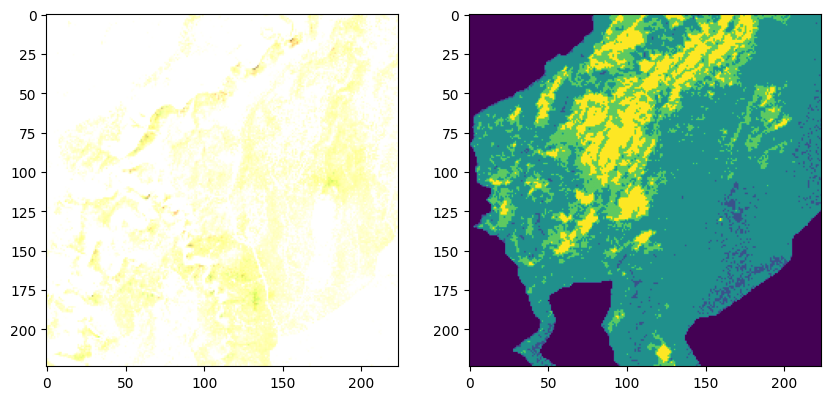

In [17]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 10))
ax[0].imshow(rio.open_rasterio(file_image_path).sel(band=[3, 2, 1]).transpose("y", "x", "band").to_numpy())

ax[1].imshow(rio.open_rasterio(file_label_path).to_numpy()[0])

In [27]:
tensor = rio.open_rasterio(file_label_path).to_numpy()
print(tensor.shape)

import numpy as np
np.unique(tensor)

(1, 224, 224)


array([0., 1., 2., 3., 4.])

In [82]:
import rasterio
import numpy as np
import os
from tqdm import tqdm

# Paths to the folders containing the images
train_image_folder = "/kaggle/input/burn-data-seg/burn_intensity_data/train_images"
val_image_folder = "/kaggle/input/burn-data-seg/burn_intensity_data/validation_images"

bands_order = ['BLUE', 'GREEN', 'RED', 'NIR', 'SWIR_1', 'SWIR_2']
num_bands = len(bands_order)
sum_bands = np.zeros(num_bands, dtype=np.float64)
sum_squared_diffs = np.zeros(num_bands, dtype=np.float64)
total_pixels = np.zeros(num_bands, dtype=np.int64)

# Function to process a folder and accumulate stats
def process_folder(folder_path):
    global sum_bands, sum_squared_diffs, total_pixels
    for image_file in tqdm(os.listdir(folder_path), desc=f"Processing {folder_path}"):
        file_path = os.path.join(folder_path, image_file)
        
        with rasterio.open(file_path) as src:
            image_data = src.read().astype(np.float64)
            nodata_value = src.nodata  # Get the no-data value (e.g., -9999)
        
        for i in range(num_bands):
            band_data = image_data[i, :, :]
            
            # Mask no-data values and clip negative values to zero
            valid_pixels = (band_data != nodata_value) & (band_data >= 0)
            valid_band_data = band_data[valid_pixels]
            
            # Only accumulate if there are valid pixels
            if valid_band_data.size > 0:
                sum_bands[i] += np.sum(valid_band_data)
                sum_squared_diffs[i] += np.sum((valid_band_data - np.mean(valid_band_data)) ** 2)
                total_pixels[i] += valid_band_data.size

# Process both train and validation folders
process_folder(train_image_folder)
process_folder(val_image_folder)

# Compute mean and standard deviation for each band
means = sum_bands / total_pixels
stds = np.sqrt(sum_squared_diffs / total_pixels)

# Replace any negative means with a small positive value
MEANS = {band: round(max(means[i], 0.01), 4) for i, band in enumerate(bands_order)}
STDS = {band: round(stds[i], 4) for i, band in enumerate(bands_order)}
print("MEANS =", MEANS)
print("STDS =", STDS)

Processing /kaggle/input/burn-data-seg/burn_intensity_data/train_images: 100%|██████████| 236/236 [00:04<00:00, 54.30it/s]
Processing /kaggle/input/burn-data-seg/burn_intensity_data/validation_images: 100%|██████████| 30/30 [00:00<00:00, 55.03it/s]

MEANS = {'BLUE': 350.7673, 'GREEN': 533.9899, 'RED': 617.2553, 'NIR': 1640.5476, 'SWIR_1': 1180.0582, 'SWIR_2': 1761.7007}
STDS = {'BLUE': 258.2673, 'GREEN': 291.0636, 'RED': 342.4452, 'NIR': 627.7795, 'SWIR_1': 538.4357, 'SWIR_2': 581.7906}


In [ ]:
from collections.abc import Sequence
bands = ["BLUE", "GREEN", "RED", "NIR", "SWIR_1", "SWIR_2"]

rgb_bands = ("RED", "GREEN", "BLUE")



MEANS = {'BLUE': 350.7673, 'GREEN': 533.9899, 'RED': 617.2553, 'NIR': 1640.5476, 'SWIR_1': 1180.0582, 'SWIR_2': 1761.7007}
STDS = {'BLUE': 258.2673, 'GREEN': 291.0636, 'RED': 342.4452, 'NIR': 627.7795, 'SWIR_1': 538.4357, 'SWIR_2': 581.7906}
means = [MEANS[b] for b in bands]
stds = [STDS[b] for b in bands]

In [84]:
from terratorch.datamodules import GenericNonGeoSegmentationDataModule

batch_size = 8
num_workers = 0
train_val_test = [
    train_image_folder,
    val_image_folder,
    test_image_folder
]

train_val_test_labels = {
    "train_label_data_root": train_label_folder,
    "val_label_data_root": val_label_folder,
    "test_label_data_root": test_label_folder,
}

# from https://github.com/NASA-IMPACT/hls-foundation-os/blob/main/configs/burn_scars.py
# means=[
#         0.033349706741586264,
#         0.05701185520536176,
#         0.05889748132001316,
#         0.2323245113436119,
#         0.1972854853760658,
#         0.11944914225186566,
#     ]
# stds=[
#         0.02269135568823774,
#         0.026807560223070237,
#         0.04004109844362779,
#         0.07791732423672691,
#         0.08708738838140137,
#         0.07241979477437814,
#     ]

datamodule = GenericNonGeoSegmentationDataModule(
    batch_size,
    num_workers,
    *train_val_test,
    "*_HLS.tiff", # img grep
    "*_BS.tiff", # label grep
    means,
    stds,
    num_classes = 5, # num classes
    **train_val_test_labels,

    # if transforms are defined with Albumentations, you can pass them here
    # train_transform=train_transform,
    # val_transform=val_transform,
    # test_transform=test_transform,

    # edit the below for your usecase
    dataset_bands=[
        HLSBands.BLUE,
        HLSBands.GREEN,
        HLSBands.RED,
        HLSBands.NIR_NARROW,
        HLSBands.SWIR_1,
        HLSBands.SWIR_2,
    ],
    output_bands=[
        HLSBands.BLUE,
        HLSBands.GREEN,
        HLSBands.RED,
        HLSBands.NIR_NARROW,
        HLSBands.SWIR_1,
        HLSBands.SWIR_2,
    ],
    no_data_replace=0,
    no_label_replace=-1,
)
# we want to access some properties of the train dataset later on, so lets call setup here
# if not, we would not need to
datamodule.setup("fit")

In [97]:

from terratorch.models.model import AuxiliaryHead
from terratorch.tasks import SemanticSegmentationTask

epochs = 120 # 1 epoch for demo
lr = 1e-3
model_args = {
        #"backbone":"prithvi_vit_100",
        'backbone': "timm_prithvi_eo_v2_300",
        #"decoder":"FCNDecoder",
        "decoder": "UperNetDecoder",
        "num_classes": 5,

        "backbone_bands": [
            HLSBands.RED,
            HLSBands.GREEN,
            HLSBands.BLUE,
            HLSBands.NIR_NARROW,
            HLSBands.SWIR_1,
            HLSBands.SWIR_2,
        ],
        "backbone_pretrained": True,
        "backbone_num_frames":1, # this is the default
        "decoder_channels":512,
        "head_dropout":0.2,
        "necks": [
            {"name": "SelectIndices", "indices": [-1]},
            {"name": "ReshapeTokensToImage"}
        ]
}


task = SemanticSegmentationTask(
    model_args,
    "EncoderDecoderFactory",
    loss="ce",
    aux_loss={"fcn_aux_head": 0.4},
    lr=lr,
    ignore_index=-1,
    optimizer="AdamW",
    optimizer_hparams={"weight_decay": 0.05},
    freeze_backbone=True,

    class_names=['No burn', 'Unburned to Very Low', 'Low Severity', 'Moderate Severity','High Severity'],
    class_weights=[0.01, 0.1, 0.19, 0.2, 0.5]
    #class_weights=[0.018, 0.14, 0.076, 0.11, 0.65]

)

/usr/local/lib/python3.10/dist-packages/timm/models/_hub.py:190: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(cached_file, map_location='cpu')


In [98]:
import os

from lightning.pytorch import Trainer
from lightning.pytorch.callbacks import EarlyStopping, LearningRateMonitor, ModelCheckpoint, RichProgressBar
from lightning.pytorch.loggers import TensorBoardLogger
import os
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.optim import AdamW

accelerator = "gpu"
experiment = "tutorial"
if not os.path.isdir("tutorial_experiments"):
    os.mkdir("tutorial_experiments")
default_root_dir = os.path.join("tutorial_experiments", experiment)
checkpoint_callback = ModelCheckpoint(monitor=task.monitor, save_top_k=1, save_last=True)
early_stopping_callback = EarlyStopping(monitor=task.monitor, min_delta=0.00, patience=10)
logger = TensorBoardLogger(save_dir=default_root_dir, name=experiment)
#reduce_lr = ReduceLROnPlateau(optimizer = task,
 #                             patience=5)
trainer = Trainer(
    precision="bf16-mixed",
    accelerator=accelerator,
    callbacks=[
        RichProgressBar(),
        checkpoint_callback,
        LearningRateMonitor(logging_interval="epoch"),
        early_stopping_callback
    ],
    logger=logger,
    max_epochs=epochs, # train only one epoch for demo
    default_root_dir=default_root_dir,
    log_every_n_steps=1,
    check_val_every_n_epoch=10,
    devices=1
)


INFO: Using bfloat16 Automatic Mixed Precision (AMP)
INFO: GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs


UperNet with Prithvi 300M (timm_prithvi_eo_v2_300), updated means and std i.e normalization

/usr/local/lib/python3.10/dist-packages/lightning/pytorch/callbacks/model_checkpoint.py:654: Checkpoint directory tutorial_experiments/tutorial/tutorial/version_10/checkpoints exists and is not empty.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


┏━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┓
┃   ┃ Name          ┃ Type             ┃ Params ┃ Mode  ┃
┡━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━┩
│ 0 │ model         │ PixelWiseModel   │  322 M │ train │
│ 1 │ criterion     │ CrossEntropyLoss │      0 │ train │
│ 2 │ train_metrics │ MetricCollection │      0 │ train │
│ 3 │ val_metrics   │ MetricCollection │      0 │ train │
│ 4 │ test_metrics  │ ModuleList       │      0 │ train │
└───┴───────────────┴──────────────────┴────────┴───────┘

Trainable params: 18.6 M                                                                                           
Non-trainable params: 303 M                                                                                        
Total params: 322 M                                                                                                
Total estimated model params size (MB): 1.3 K                                                                      
Modules in train mode: 586                                                                                         
Modules in eval mode: 0

Output()

/usr/local/lib/python3.10/dist-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 
'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the 
`num_workers` argument` to `num_workers=3` in the `DataLoader` to improve performance.

/usr/local/lib/python3.10/dist-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 
'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the 
`num_workers` argument` to `num_workers=3` in the `DataLoader` to improve performance.

INFO: `Trainer.fit` stopped: `max_epochs=120` reached.


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


Output()

/usr/local/lib/python3.10/dist-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=3` in the `DataLoader` to improve performance.


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃                   Test metric                    ┃                   DataLoader 0                   ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│             test/Multiclass_Accuracy             │                0.5857248902320862                │
│             test/Multiclass_F1_Score             │                0.5857248902320862                │
│          test/Multiclass_Jaccard_Index           │                0.2686004042625427                │
│       test/Multiclass_Jaccard_Index_Micro        │                0.414152055978775                 │
│                    test/loss                     │                1.6932364702224731                │
│      test/multiclassaccuracy_High Severity       │               0.34015607833862305                │
│       test/multiclassaccuracy_Low Severity       │               0.47624868154525757                │
│    test/multiclassaccuracy_Moderate Severity     │                0.4138658344745636                │
│         test/multiclassaccuracy_No burn          │                0.7074146866798401                │
│   test/multiclassaccuracy_Unburned to Very Low   │               0.04568509757518768                │
│    test/multiclassjaccardindex_High Severity     │               0.23127762973308563                │
│     test/multiclassjaccardindex_Low Severity     │               0.23221664130687714                │
│  test/multiclassjaccardindex_Moderate Severity   │               0.20837000012397766                │
│       test/multiclassjaccardindex_No burn        │                0.6418899297714233                │
│ test/multiclassjaccardindex_Unburned to Very Low │               0.029247751459479332               │
└──────────────────────────────────────────────────┴──────────────────────────────────────────────────┘

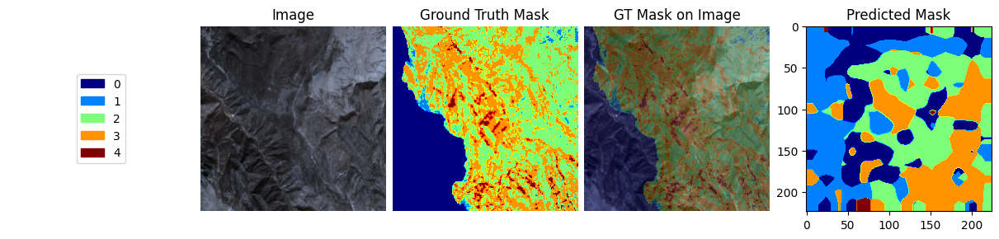

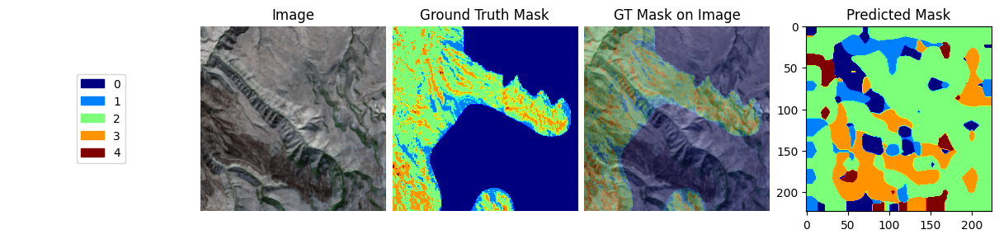

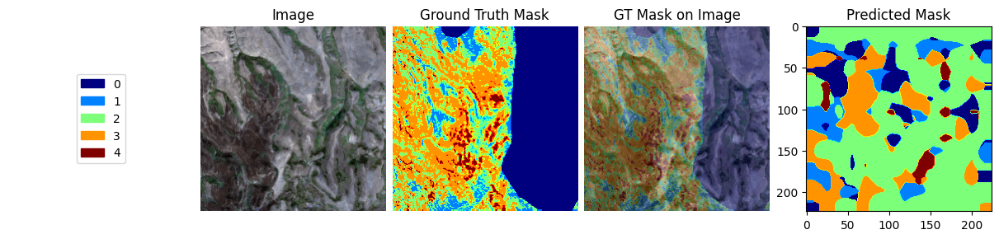

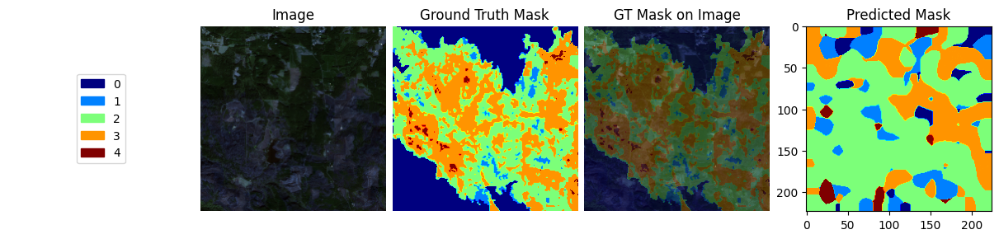

In [ ]:
#trying with timm_prithvi_eo_v2_300, 16 mixed, updated means and std i.e normalization
trainer.fit(model=task, datamodule=datamodule)
trainer.test(model=task, datamodule=datamodule)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
test_loader = datamodule.test_dataloader()
model.to(device)
with torch.no_grad():
    batch = next(iter(test_loader))
    images = batch["image"].to(device)

    masks = batch["mask"].numpy()
    other_keys = batch.keys() - {"image", "mask", "filename"}
    rest = {k: batch[k].to(device) for k in other_keys}

    outputs = model(images, **rest)
    preds = torch.argmax(outputs.output, dim=1).cpu().numpy()

for i in range(4):
    sample = {key: batch[key][i] for key in batch}
    sample["prediction"] = preds[i]
    test_dataset = datamodule.test_dataset
    test_dataset.plot(sample)

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


Output()

/usr/local/lib/python3.10/dist-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=3` in the `DataLoader` to improve performance.


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃                   Test metric                    ┃                   DataLoader 0                   ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│             test/Multiclass_Accuracy             │                0.4781741499900818                │
│             test/Multiclass_F1_Score             │                0.4781741499900818                │
│          test/Multiclass_Jaccard_Index           │               0.21801553666591644                │
│       test/Multiclass_Jaccard_Index_Micro        │               0.31421083211898804                │
│                    test/loss                     │                1.2371151447296143                │
│      test/multiclassaccuracy_High Severity       │               0.26937294006347656                │
│       test/multiclassaccuracy_Low Severity       │               0.36105671525001526                │
│    test/multiclassaccuracy_Moderate Severity     │                0.6911470890045166                │
│         test/multiclassaccuracy_No burn          │               0.49925848841667175                │
│   test/multiclassaccuracy_Unburned to Very Low   │               0.015503181144595146               │
│    test/multiclassjaccardindex_High Severity     │               0.19003236293792725                │
│     test/multiclassjaccardindex_Low Severity     │               0.16095510125160217                │
│  test/multiclassjaccardindex_Moderate Severity   │               0.25970396399497986                │
│       test/multiclassjaccardindex_No burn        │               0.47003069519996643                │
│ test/multiclassjaccardindex_Unburned to Very Low │               0.00935559906065464                │
└──────────────────────────────────────────────────┴──────────────────────────────────────────────────┘

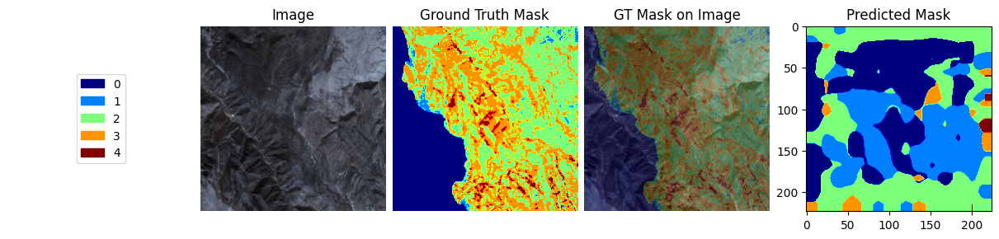

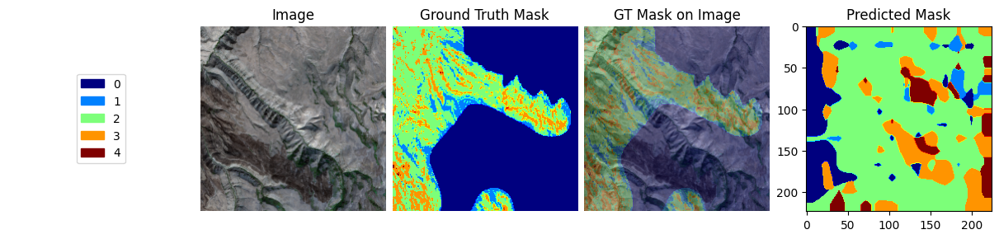

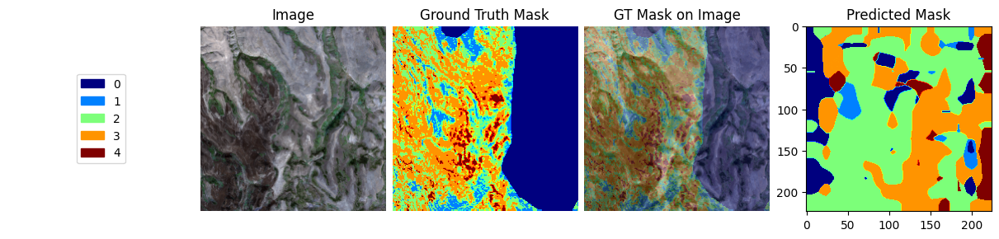

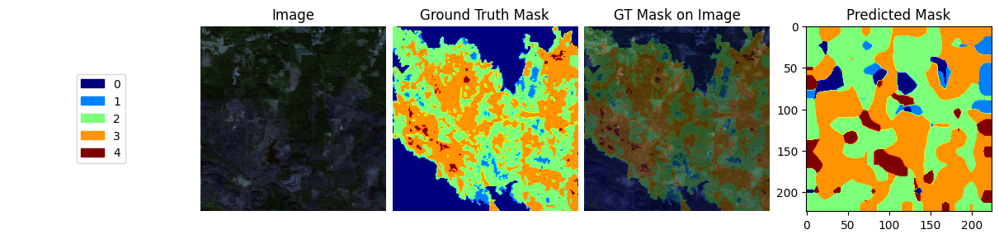

In [ ]:
# UperNet without normalization
trainer.test(model=task, datamodule=datamodule)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
test_loader = datamodule.test_dataloader()
model.to(device)
with torch.no_grad():
    batch = next(iter(test_loader))
    images = batch["image"].to(device)

    masks = batch["mask"].numpy()
    other_keys = batch.keys() - {"image", "mask", "filename"}
    rest = {k: batch[k].to(device) for k in other_keys}

    outputs = model(images, **rest)
    preds = torch.argmax(outputs.output, dim=1).cpu().numpy()

for i in range(4):
    sample = {key: batch[key][i] for key in batch}
    sample["prediction"] = preds[i]
    test_dataset = datamodule.test_dataset
    test_dataset.plot(sample)

#qith 80 epochs

UperNet without normalization with 120 epochs

/usr/local/lib/python3.10/dist-packages/lightning/pytorch/callbacks/model_checkpoint.py:654: Checkpoint directory tutorial_experiments/tutorial/tutorial/version_0/checkpoints exists and is not empty.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


┏━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┓
┃   ┃ Name          ┃ Type             ┃ Params ┃ Mode  ┃
┡━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━┩
│ 0 │ model         │ PixelWiseModel   │  103 M │ train │
│ 1 │ criterion     │ CrossEntropyLoss │      0 │ train │
│ 2 │ train_metrics │ MetricCollection │      0 │ train │
│ 3 │ val_metrics   │ MetricCollection │      0 │ train │
│ 4 │ test_metrics  │ ModuleList       │      0 │ train │
└───┴───────────────┴──────────────────┴────────┴───────┘

Trainable params: 16.9 M                                                                                           
Non-trainable params: 86.2 M                                                                                       
Total params: 103 M                                                                                                
Total estimated model params size (MB): 412                                                                        
Modules in train mode: 334                                                                                         
Modules in eval mode: 0

Output()

/usr/local/lib/python3.10/dist-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 
'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the 
`num_workers` argument` to `num_workers=3` in the `DataLoader` to improve performance.

/usr/local/lib/python3.10/dist-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 
'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the 
`num_workers` argument` to `num_workers=3` in the `DataLoader` to improve performance.

INFO: `Trainer.fit` stopped: `max_epochs=120` reached.


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


Output()

/usr/local/lib/python3.10/dist-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=3` in the `DataLoader` to improve performance.


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃                   Test metric                    ┃                   DataLoader 0                   ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│             test/Multiclass_Accuracy             │               0.39147865772247314                │
│             test/Multiclass_F1_Score             │               0.39147865772247314                │
│          test/Multiclass_Jaccard_Index           │               0.19502390921115875                │
│       test/Multiclass_Jaccard_Index_Micro        │               0.24337796866893768                │
│                    test/loss                     │                1.1939674615859985                │
│      test/multiclassaccuracy_High Severity       │                0.4780941903591156                │
│       test/multiclassaccuracy_Low Severity       │                0.5245750546455383                │
│    test/multiclassaccuracy_Moderate Severity     │                0.5782665610313416                │
│         test/multiclassaccuracy_No burn          │                0.327282190322876                 │
│   test/multiclassaccuracy_Unburned to Very Low   │               0.033085402101278305               │
│    test/multiclassjaccardindex_High Severity     │               0.20389097929000854                │
│     test/multiclassjaccardindex_Low Severity     │               0.16766780614852905                │
│  test/multiclassjaccardindex_Moderate Severity   │                0.2650998830795288                │
│       test/multiclassjaccardindex_No burn        │                0.3193366527557373                │
│ test/multiclassjaccardindex_Unburned to Very Low │               0.01912418194115162                │
└──────────────────────────────────────────────────┴──────────────────────────────────────────────────┘

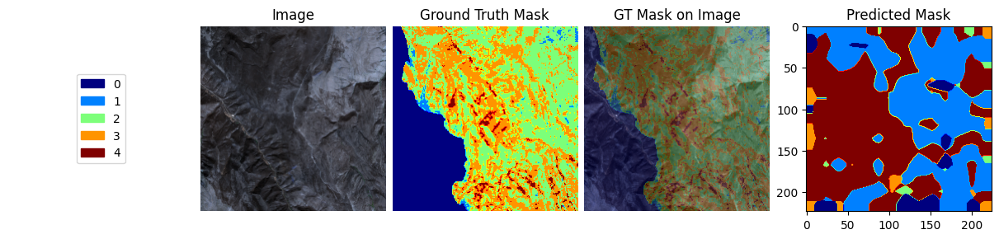

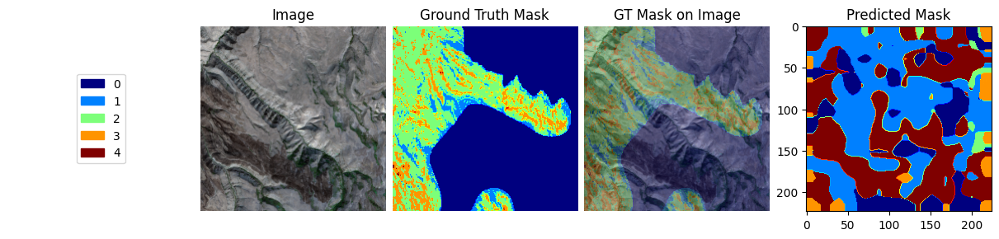

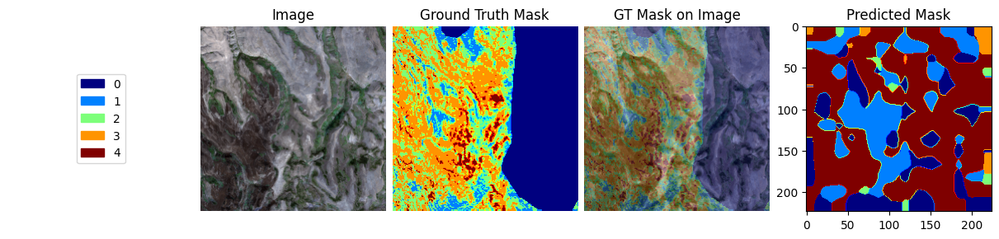

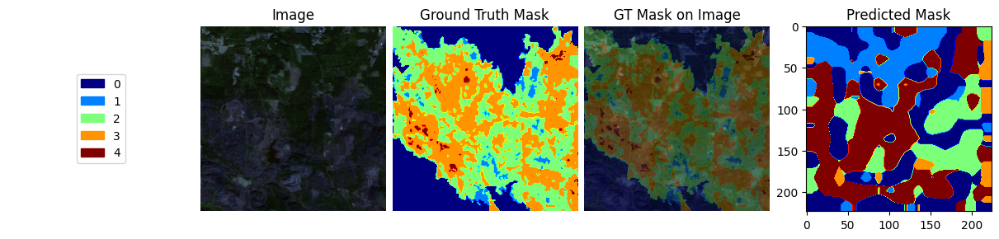

In [22]:
trainer.fit(model=task, datamodule=datamodule)
trainer.test(model=task, datamodule=datamodule)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
test_loader = datamodule.test_dataloader()
model.to(device)
with torch.no_grad():
    batch = next(iter(test_loader))
    images = batch["image"].to(device)

    masks = batch["mask"].numpy()
    other_keys = batch.keys() - {"image", "mask", "filename"}
    rest = {k: batch[k].to(device) for k in other_keys}

    outputs = model(images, **rest)
    preds = torch.argmax(outputs.output, dim=1).cpu().numpy()

for i in range(4):
    sample = {key: batch[key][i] for key in batch}
    sample["prediction"] = preds[i]
    test_dataset = datamodule.test_dataset
    test_dataset.plot(sample)

Using FCN decoder on Prithvi 100M 

In [43]:
trainer.fit(model=task, datamodule=datamodule)

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


┏━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┓
┃   ┃ Name          ┃ Type             ┃ Params ┃ Mode  ┃
┡━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━┩
│ 0 │ model         │ PixelWiseModel   │ 87.4 M │ train │
│ 1 │ criterion     │ CrossEntropyLoss │      0 │ train │
│ 2 │ train_metrics │ MetricCollection │      0 │ train │
│ 3 │ val_metrics   │ MetricCollection │      0 │ train │
│ 4 │ test_metrics  │ ModuleList       │      0 │ train │
└───┴───────────────┴──────────────────┴────────┴───────┘

Trainable params: 1.2 M                                                                                            
Non-trainable params: 86.2 M                                                                                       
Total params: 87.4 M                                                                                               
Total estimated model params size (MB): 349                                                                        
Modules in train mode: 324                                                                                         
Modules in eval mode: 0

Output()

/usr/local/lib/python3.10/dist-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 
'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the 
`num_workers` argument` to `num_workers=3` in the `DataLoader` to improve performance.

/usr/local/lib/python3.10/dist-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 
'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the 
`num_workers` argument` to `num_workers=3` in the `DataLoader` to improve performance.

INFO: `Trainer.fit` stopped: `max_epochs=80` reached.


In [47]:
trainer.test(model=task, datamodule=datamodule)

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


Output()

/usr/local/lib/python3.10/dist-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=3` in the `DataLoader` to improve performance.


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃                   Test metric                    ┃                   DataLoader 0                   ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│             test/Multiclass_Accuracy             │               0.38085073232650757                │
│             test/Multiclass_F1_Score             │               0.38085073232650757                │
│          test/Multiclass_Jaccard_Index           │               0.19249674677848816                │
│       test/Multiclass_Jaccard_Index_Micro        │               0.23521657288074493                │
│                    test/loss                     │                1.2455049753189087                │
│      test/multiclassaccuracy_High Severity       │                0.6152656078338623                │
│       test/multiclassaccuracy_Low Severity       │                0.6003662943840027                │
│    test/multiclassaccuracy_Moderate Severity     │               0.27077847719192505                │
│         test/multiclassaccuracy_No burn          │               0.35808584094047546                │
│   test/multiclassaccuracy_Unburned to Very Low   │                       0.0                        │
│    test/multiclassjaccardindex_High Severity     │               0.29819777607917786                │
│     test/multiclassjaccardindex_Low Severity     │                0.1518535166978836                │
│  test/multiclassjaccardindex_Moderate Severity   │                0.1745181828737259                │
│       test/multiclassjaccardindex_No burn        │               0.33791425824165344                │
│ test/multiclassjaccardindex_Unburned to Very Low │                       0.0                        │
└──────────────────────────────────────────────────┴──────────────────────────────────────────────────┘

[{'test/loss': 1.2455049753189087,
  'test/Multiclass_Accuracy': 0.38085073232650757,
  'test/multiclassaccuracy_No burn': 0.35808584094047546,
  'test/multiclassaccuracy_Unburned to Very Low': 0.0,
  'test/multiclassaccuracy_Low Severity': 0.6003662943840027,
  'test/multiclassaccuracy_Moderate Severity': 0.27077847719192505,
  'test/multiclassaccuracy_High Severity': 0.6152656078338623,
  'test/Multiclass_F1_Score': 0.38085073232650757,
  'test/Multiclass_Jaccard_Index': 0.19249674677848816,
  'test/multiclassjaccardindex_No burn': 0.33791425824165344,
  'test/multiclassjaccardindex_Unburned to Very Low': 0.0,
  'test/multiclassjaccardindex_Low Severity': 0.1518535166978836,
  'test/multiclassjaccardindex_Moderate Severity': 0.1745181828737259,
  'test/multiclassjaccardindex_High Severity': 0.29819777607917786,
  'test/Multiclass_Jaccard_Index_Micro': 0.23521657288074493}]

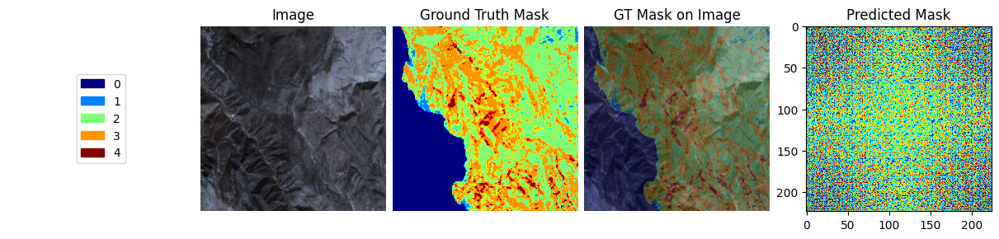

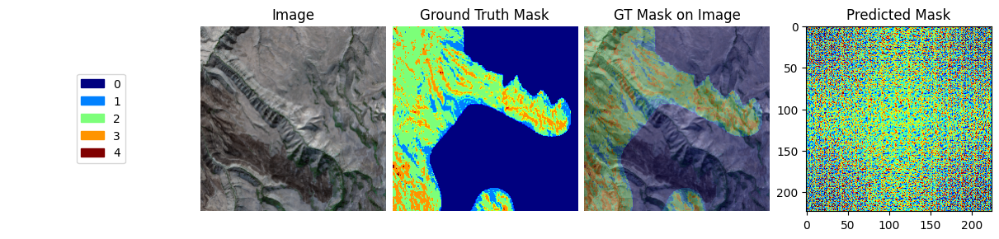

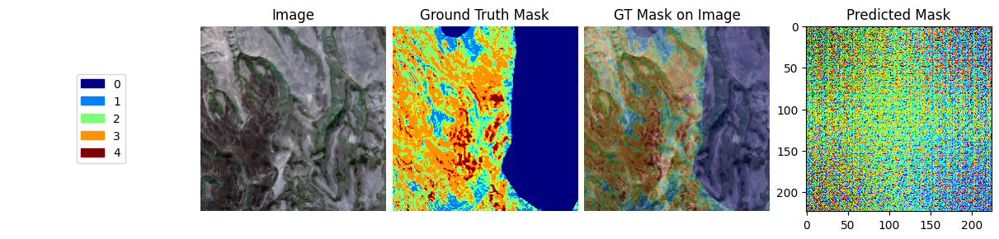

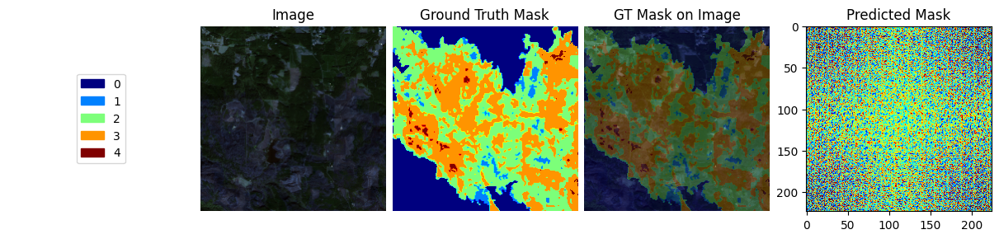

In [57]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
test_loader = datamodule.test_dataloader()
model.to(device)
with torch.no_grad():
    batch = next(iter(test_loader))
    images = batch["image"].to(device)

    masks = batch["mask"].numpy()
    other_keys = batch.keys() - {"image", "mask", "filename"}
    rest = {k: batch[k].to(device) for k in other_keys}

    outputs = model(images, **rest)
    preds = torch.argmax(outputs.output, dim=1).cpu().numpy()

for i in range(4):
    sample = {key: batch[key][i] for key in batch}
    sample["prediction"] = preds[i]
    test_dataset = datamodule.test_dataset
    test_dataset.plot(sample)

In [34]:
trainer.fit(model=task, datamodule=datamodule)

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


┏━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┓
┃   ┃ Name          ┃ Type             ┃ Params ┃ Mode  ┃
┡━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━┩
│ 0 │ model         │ PixelWiseModel   │ 87.4 M │ train │
│ 1 │ criterion     │ CrossEntropyLoss │      0 │ train │
│ 2 │ train_metrics │ MetricCollection │      0 │ train │
│ 3 │ val_metrics   │ MetricCollection │      0 │ train │
│ 4 │ test_metrics  │ ModuleList       │      0 │ train │
└───┴───────────────┴──────────────────┴────────┴───────┘

Trainable params: 1.2 M                                                                                            
Non-trainable params: 86.2 M                                                                                       
Total params: 87.4 M                                                                                               
Total estimated model params size (MB): 349                                                                        
Modules in train mode: 324                                                                                         
Modules in eval mode: 0

Output()

/usr/local/lib/python3.10/dist-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 
'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the 
`num_workers` argument` to `num_workers=3` in the `DataLoader` to improve performance.

/usr/local/lib/python3.10/dist-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 
'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the 
`num_workers` argument` to `num_workers=3` in the `DataLoader` to improve performance.

INFO: `Trainer.fit` stopped: `max_epochs=60` reached.


In [35]:
trainer.test(model=task, datamodule=datamodule)

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


Output()

/usr/local/lib/python3.10/dist-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=3` in the `DataLoader` to improve performance.


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃                   Test metric                    ┃                   DataLoader 0                   ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│             test/Multiclass_Accuracy             │                0.3798389732837677                │
│             test/Multiclass_F1_Score             │                0.3798389732837677                │
│          test/Multiclass_Jaccard_Index           │               0.18982310593128204                │
│       test/Multiclass_Jaccard_Index_Micro        │               0.23444519937038422                │
│                    test/loss                     │                1.2721400260925293                │
│      test/multiclassaccuracy_High Severity       │               0.30677711963653564                │
│       test/multiclassaccuracy_Low Severity       │                0.5984383225440979                │
│    test/multiclassaccuracy_Moderate Severity     │                0.3988790810108185                │
│         test/multiclassaccuracy_No burn          │                0.3497837483882904                │
│   test/multiclassaccuracy_Unburned to Very Low   │                       0.0                        │
│    test/multiclassjaccardindex_High Severity     │               0.21444568037986755                │
│     test/multiclassjaccardindex_Low Severity     │               0.14266523718833923                │
│  test/multiclassjaccardindex_Moderate Severity   │                0.2614516317844391                │
│       test/multiclassjaccardindex_No burn        │               0.33055293560028076                │
│ test/multiclassjaccardindex_Unburned to Very Low │                       0.0                        │
└──────────────────────────────────────────────────┴──────────────────────────────────────────────────┘

[{'test/loss': 1.2721400260925293,
  'test/Multiclass_Accuracy': 0.3798389732837677,
  'test/multiclassaccuracy_No burn': 0.3497837483882904,
  'test/multiclassaccuracy_Unburned to Very Low': 0.0,
  'test/multiclassaccuracy_Low Severity': 0.5984383225440979,
  'test/multiclassaccuracy_Moderate Severity': 0.3988790810108185,
  'test/multiclassaccuracy_High Severity': 0.30677711963653564,
  'test/Multiclass_F1_Score': 0.3798389732837677,
  'test/Multiclass_Jaccard_Index': 0.18982310593128204,
  'test/multiclassjaccardindex_No burn': 0.33055293560028076,
  'test/multiclassjaccardindex_Unburned to Very Low': 0.0,
  'test/multiclassjaccardindex_Low Severity': 0.14266523718833923,
  'test/multiclassjaccardindex_Moderate Severity': 0.2614516317844391,
  'test/multiclassjaccardindex_High Severity': 0.21444568037986755,
  'test/Multiclass_Jaccard_Index_Micro': 0.23444519937038422}]

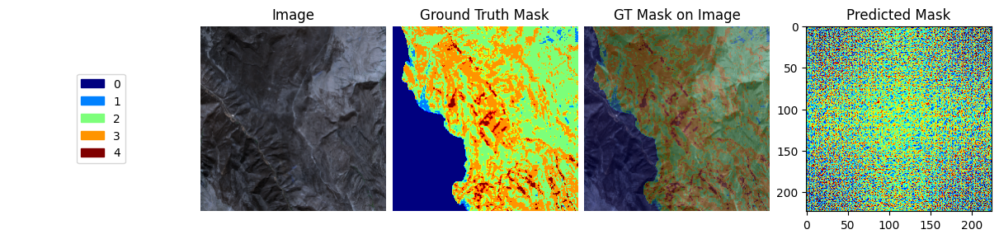

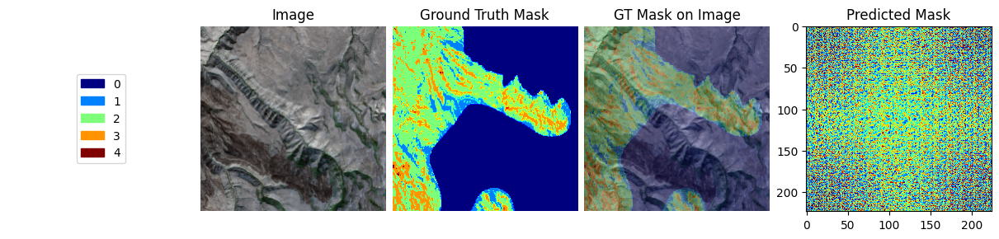

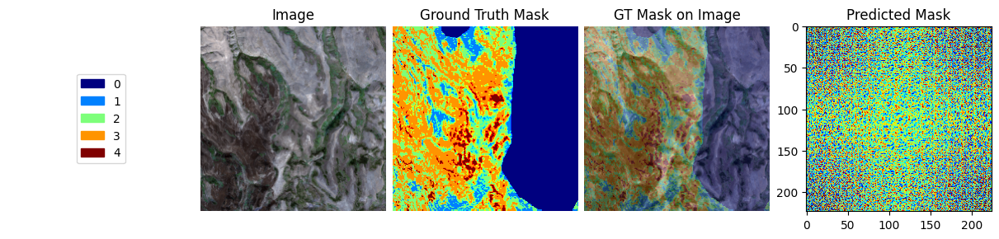

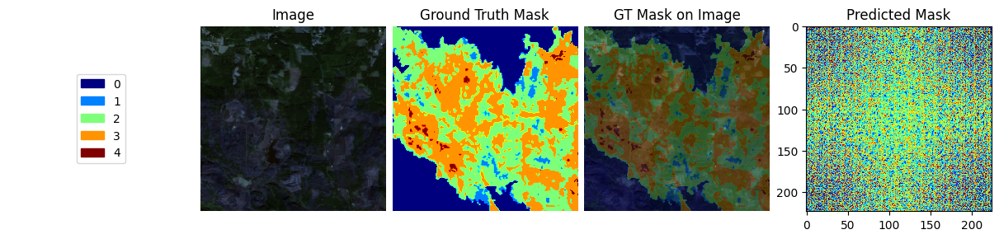

In [39]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
test_loader = datamodule.test_dataloader()
model.to(device)
with torch.no_grad():
    batch = next(iter(test_loader))
    images = batch["image"].to(device)

    masks = batch["mask"].numpy()
    other_keys = batch.keys() - {"image", "mask", "filename"}
    rest = {k: batch[k].to(device) for k in other_keys}

    outputs = model(images, **rest)
    preds = torch.argmax(outputs.output, dim=1).cpu().numpy()

for i in range(4):
    sample = {key: batch[key][i] for key in batch}
    sample["prediction"] = preds[i]
    test_dataset = datamodule.test_dataset
    test_dataset.plot(sample)